# AI Challenge :Car Image Classification

In this AI coding challenge, you will be asked to solve a given problem, and the result will be
assessed based on certain criteria. This is to assess coding skills and the ability to fully utilize the
right algorithms.
The dataset contains ~900 images from 10 categories.


#### <font color='Blue'>1. Setting up file locations and access files

In [1]:
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)
path_train='./gdrive/My Drive/cars_dataset/train'
path_test='./gdrive/My Drive/cars_dataset/test'
path_val='./gdrive/My Drive/cars_dataset/val'

path_ytrain='./gdrive/My Drive/cars_dataset'
path_yval='./gdrive/My Drive/cars_dataset'

# path_train='./cars_dataset/train'
# path_test='./cars_dataset/test'
# path_val='./cars_dataset/val'
# path_ytrain='./cars_dataset'
# path_yval='./cars_dataset'


import os
import numpy as np
from os import listdir

train_pix = [ os.path.join(path_train, fname)  for fname in listdir(path_train) ] 

test_pix = [ os.path.join(path_test, fname)  for fname in listdir(path_test)]

val_pix = [os.path.join(path_val, fname)  for fname in listdir(path_val)]

Mounted at /content/gdrive


#### <font color='Blue'>2. Exploring the image data and precursory checks

In [2]:
# Set up matplotlib fig, and size it to fit 4x4 pics
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from PIL import Image

def show_image(img):
    print(img)
    image = Image.open(img)
    print(image.size)
    img = mpimg.imread(img)
  
    print(img.size)
    plt.imshow(img)
    plt.show()
    return
          


In [3]:
import pandas as pd
Y_train=np.load(os.path.join(path_ytrain,'train.label.npy'))
print(Y_train.shape)

print(Y_train[0:5])
dframe_Ytrain=pd.DataFrame(Y_train,columns=['Category'])
dframe_Ytrain['index']=[fname for fname in sorted(os.listdir(path_train))]
print(dframe_Ytrain.shape)
Y_val=np.load(os.path.join(path_yval,'val.label.npy'))
dframe_Yval=pd.DataFrame(Y_val,columns=['Category'])
dframe_Yval['index']=[fname for fname in sorted(os.listdir(path_val))]

dframe_Ytest=pd.DataFrame()
dframe_Ytest['index']=[fname for fname in sorted(os.listdir(path_test))]
dframe_Ytest['Category']=100

print('\n -------------------- Train data distribution-----------------')

dframe_Ytrain.head(7)

(388,)
[5 1 0 0 1]
(388, 2)

 -------------------- Train data distribution-----------------


,Category,index
0,5,00000.jpg
1,1,00001.jpg
2,0,00002.jpg
3,0,00003.jpg
4,1,00004.jpg
5,8,00005.jpg
6,2,00006.jpg


In [4]:
dframe_Ytest.head(7)

,index,Category
0,00000.jpg,100
1,00001.jpg,100
2,00002.jpg,100
3,00003.jpg,100
4,00004.jpg,100
5,00005.jpg,100
6,00006.jpg,100


#### <font color='Blue'>3. Validate the class representation is balanced


---------------- Training Data Class Distribution---------------



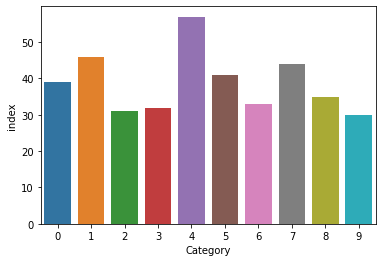


---------------- Validation Data Class Distribution---------------



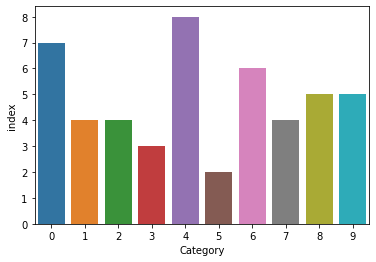

In [5]:

import seaborn as sns
print('\n---------------- Training Data Class Distribution---------------\n')
sns.barplot(x='Category',y='index',data=dframe_Ytrain.groupby('Category',as_index=False)['index'].count())
plt.show()
print('\n---------------- Validation Data Class Distribution---------------\n')
sns.barplot(x='Category',y='index',data=dframe_Yval.groupby('Category',as_index=False)['index'].count())

#### <font color='Blue'>4. Explore each category for eyeballing



 ----------------------------------------------------------------------- Category-- 0 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00002.jpg
(800, 600)
1440000


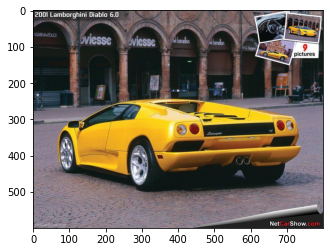

./gdrive/My Drive/cars_dataset/train/00003.jpg
(1024, 680)
2088960


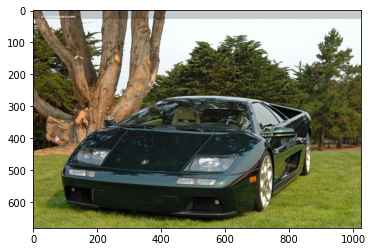

./gdrive/My Drive/cars_dataset/train/00017.jpg
(800, 465)
1116000


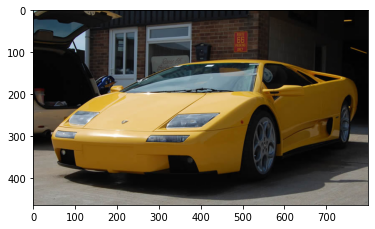

./gdrive/My Drive/cars_dataset/train/00037.jpg
(1920, 1200)
6912000


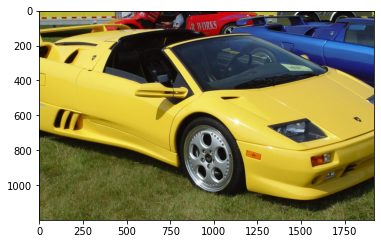



 ----------------------------------------------------------------------- Category-- 1 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00001.jpg
(500, 375)
562500


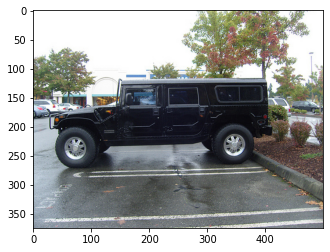

./gdrive/My Drive/cars_dataset/train/00004.jpg
(130, 98)
38220


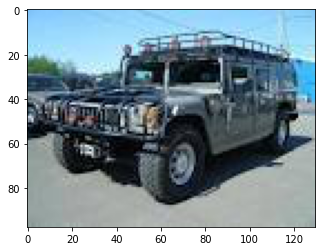

./gdrive/My Drive/cars_dataset/train/00018.jpg
(400, 295)
354000


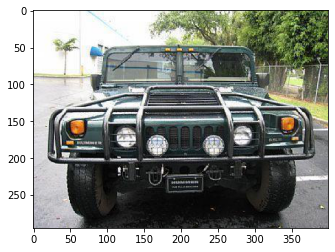

./gdrive/My Drive/cars_dataset/train/00021.jpg
(148, 111)
49284


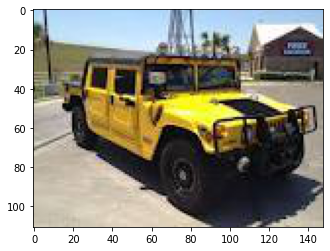



 ----------------------------------------------------------------------- Category-- 2 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00006.jpg
(259, 194)
150738


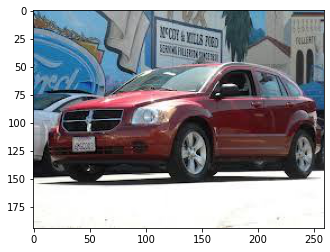

./gdrive/My Drive/cars_dataset/train/00007.jpg
(640, 480)
921600


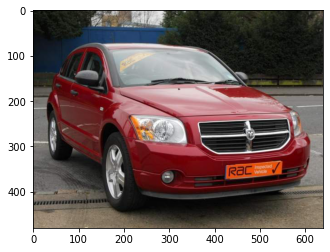

./gdrive/My Drive/cars_dataset/train/00015.jpg
(259, 194)
150738


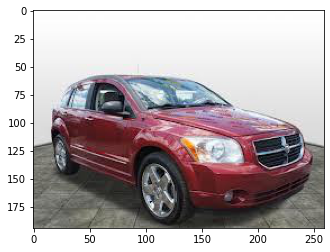

./gdrive/My Drive/cars_dataset/train/00025.jpg
(1000, 500)
1500000


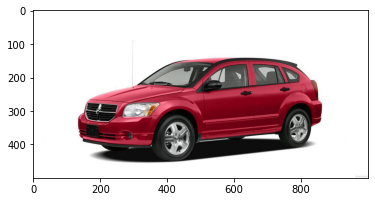



 ----------------------------------------------------------------------- Category-- 3 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00012.jpg
(625, 416)
780000


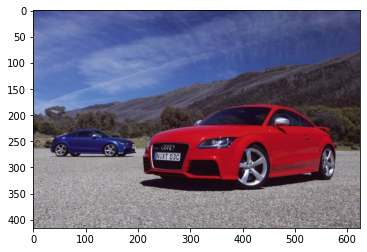

./gdrive/My Drive/cars_dataset/train/00019.jpg
(800, 600)
1440000


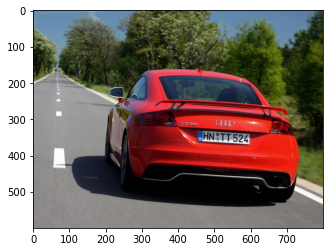

./gdrive/My Drive/cars_dataset/train/00027.jpg
(510, 387)
592110


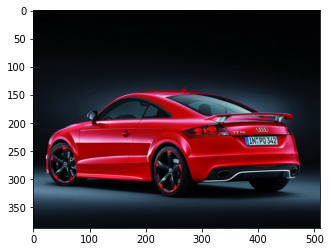

./gdrive/My Drive/cars_dataset/train/00035.jpg
(400, 267)
320400


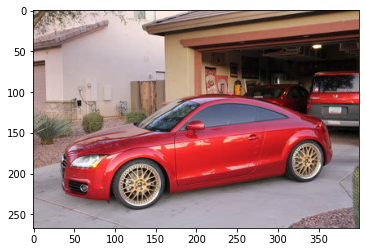



 ----------------------------------------------------------------------- Category-- 4 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00031.jpg
(240, 149)
107280


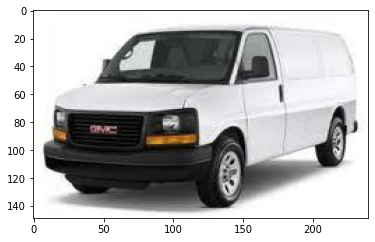

./gdrive/My Drive/cars_dataset/train/00043.jpg
(259, 194)
150738


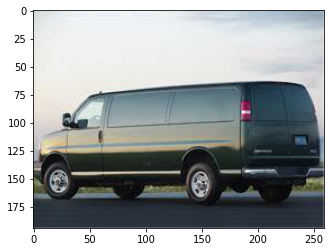

./gdrive/My Drive/cars_dataset/train/00044.jpg
(1024, 768)
2359296


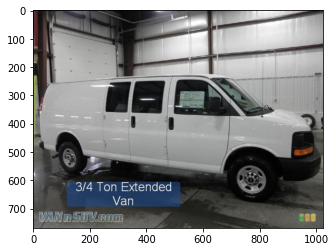

./gdrive/My Drive/cars_dataset/train/00054.jpg
(300, 166)
149400


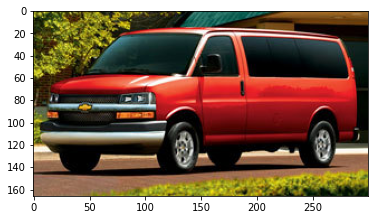



 ----------------------------------------------------------------------- Category-- 5 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00000.jpg
(400, 267)
320400


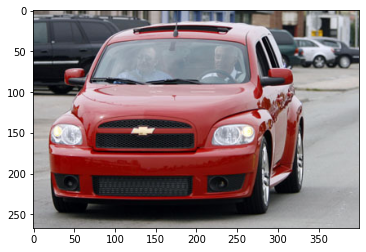

./gdrive/My Drive/cars_dataset/train/00008.jpg
(200, 150)
90000


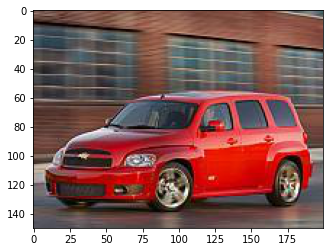

./gdrive/My Drive/cars_dataset/train/00013.jpg
(786, 492)
1160136


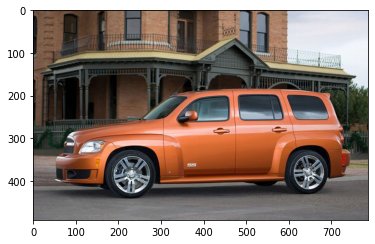

./gdrive/My Drive/cars_dataset/train/00028.jpg
(300, 225)
202500


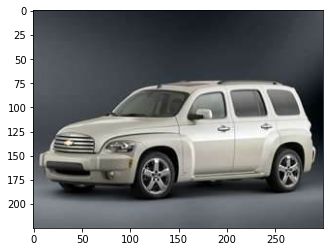



 ----------------------------------------------------------------------- Category-- 6 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00010.jpg
(586, 390)
685620


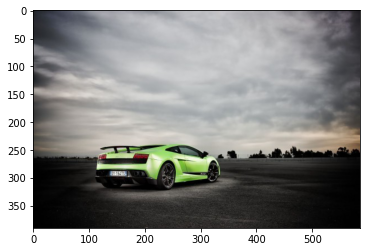

./gdrive/My Drive/cars_dataset/train/00024.jpg
(500, 297)
445500


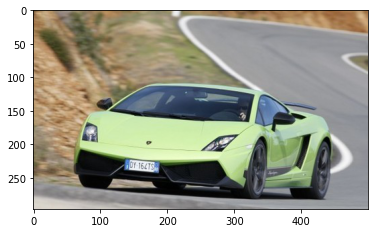

./gdrive/My Drive/cars_dataset/train/00058.jpg
(500, 334)
501000


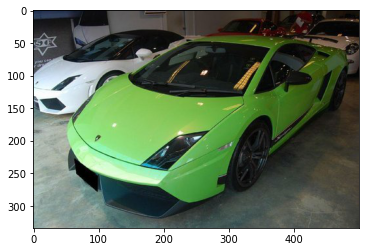

./gdrive/My Drive/cars_dataset/train/00086.jpg
(792, 345)
819720


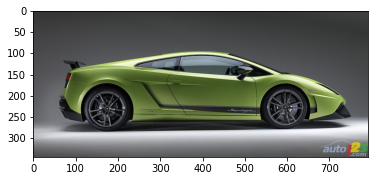



 ----------------------------------------------------------------------- Category-- 7 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00011.jpg
(1600, 1200)
5760000


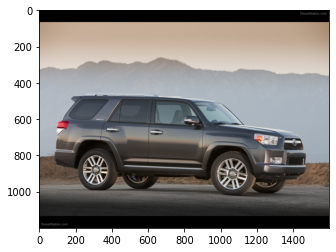

./gdrive/My Drive/cars_dataset/train/00020.jpg
(390, 216)
252720


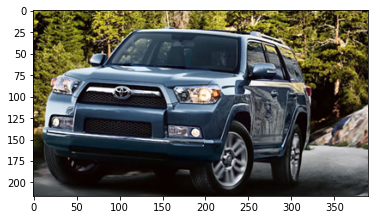

./gdrive/My Drive/cars_dataset/train/00023.jpg
(580, 348)
605520


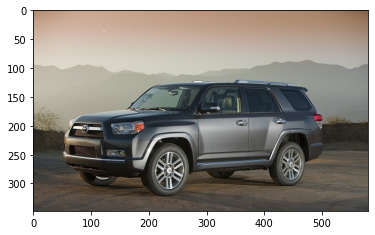

./gdrive/My Drive/cars_dataset/train/00048.jpg
(279, 236)
197532


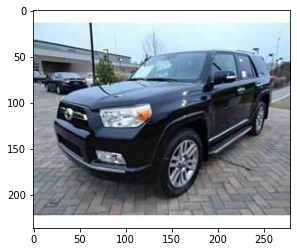



 ----------------------------------------------------------------------- Category-- 8 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00005.jpg
(500, 324)
486000


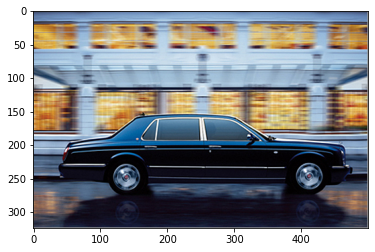

./gdrive/My Drive/cars_dataset/train/00040.jpg
(648, 432)
839808


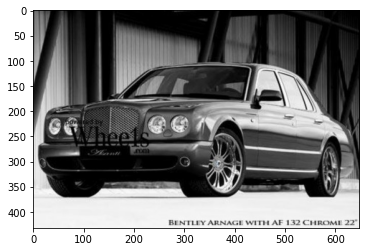

./gdrive/My Drive/cars_dataset/train/00042.jpg
(275, 183)
150975


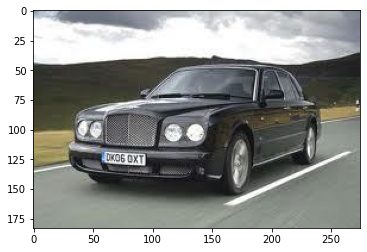

./gdrive/My Drive/cars_dataset/train/00045.jpg
(640, 480)
921600


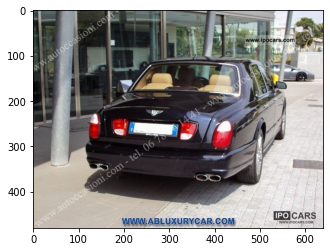



 ----------------------------------------------------------------------- Category-- 9 ----------------------------------------------



./gdrive/My Drive/cars_dataset/train/00009.jpg
(553, 369)
612171


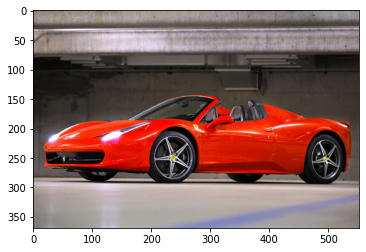

./gdrive/My Drive/cars_dataset/train/00014.jpg
(645, 349)
675315


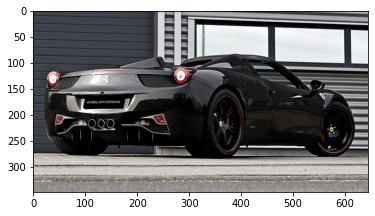

./gdrive/My Drive/cars_dataset/train/00016.jpg
(500, 375)
562500


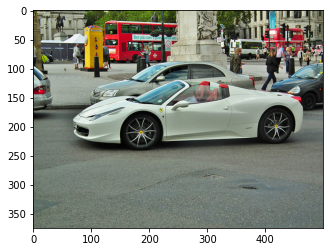

./gdrive/My Drive/cars_dataset/train/00032.jpg
(645, 349)
675315


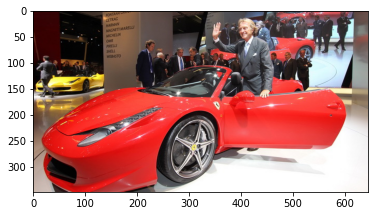

In [6]:
dict_image=dict()
for i in range(0,10):
    dict_image[i]=dframe_Ytrain[dframe_Ytrain.Category==i]['index'].head(4)
    


for key,val in dict_image.items():
    print('\n\n ----------------------------------------------------------------------- Category--',str(key),'----------------------------------------------\n')
    print('\n')
    for img in val:
        show_image(os.path.join(path_train,img))

        



#### <font color='Blue'>5. Transfer Learning ( VGG16 , InceptionV3)

#### <font color='Black'>5a. Image Augmentation

In [7]:
import tensorflow as tf 
from keras.preprocessing.image  import ImageDataGenerator 
from keras import layers 
from keras import Model 
import matplotlib.pyplot as plt


# Add our data-augmentation parameters to ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1./255.,rotation_range = 40, width_shift_range = 0.2, height_shift_range = 0.2, shear_range = 0.2, zoom_range = 0.2, horizontal_flip = True)

# Note that the validation data should not be augmented!
val_datagen = ImageDataGenerator( rescale = 1.0/255. )
test_datagen = ImageDataGenerator( rescale = 1.0/255. )



# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_dataframe(dataframe=dframe_Ytrain,directory=path_train,x_col='index',y_col='Category', batch_size = 20, class_mode = 'raw', target_size = (255,255))

# Flow validation images in batches of 20 using test_datagen generator
validation_generator = val_datagen.flow_from_dataframe(dataframe=dframe_Yval,directory= path_val,x_col='index',y_col='Category',  batch_size = 20, class_mode = 'raw', target_size = (255,255))

test_generator=test_datagen.flow_from_dataframe(dataframe=dframe_Ytest,directory= path_test,x_col='index',y_col='Category',  batch_size = 20, class_mode = 'raw', target_size = (255,255))


Found 388 validated image filenames.
Found 48 validated image filenames.
Found 423 validated image filenames.


#### <font color='Black'>5b. Pre-Trained Model (VGG16)

In [8]:
from keras.applications.vgg16 import VGG16

def create_model_vgg(input_shape=(255,255, 3), num_classes= 10):
    # Remove fully connected layer at top (include_top=False)
    # Dont load any pre-trained weights (weights=None)
    print(input_shape)
    base_model = VGG16(
        include_top=False,
        weights='imagenet',
        input_shape=input_shape)

    # Use keras functional Api to add input and output layers for our task
    input = tf.keras.Input(shape=input_shape)
    base_model = base_model(input)

    # Add our own layers 
    x = layers.GlobalMaxPooling2D()(base_model)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(128, activation="relu")(x)
    
    output = tf.keras.layers.Dense(num_classes, activation="softmax")(x)

    model = tf.keras.models.Model(input, output)

    return model

In [9]:
def plot_accuracy(history):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['train', 'Validation'])
    plt.show()
    return

def plot_loss(history):
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['train', 'Validation'])
    plt.show()
    return


In [10]:
# Function to compile a given model
import keras
from tensorflow.keras import optimizers
def compile_model(model, lr):
    model.compile(
        optimizer=optimizers.RMSprop(learning_rate=lr),
        loss=keras.losses.SparseCategoricalCrossentropy(),
        metrics=['accuracy']
    )
    
    return model


def lock_base_model_trainable(model, isTrainable=False):
    base_model_layers = model.layers[1].layers
    print("Number of layers in the base model: ", len(base_model_layers))
    fine_tune_at=len(model.layers)-3
    if isTrainable==True:
      for layer in model.layers[:fine_tune_at]:
        layer.trainable = False
        return model

    else:
      for layer in base_model_layers:
          layer.trainable = isTrainable

    return model


early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", mode="min", patience=10,    restore_best_weights=True)





In [11]:
model_1 = create_model_vgg()

model_1.summary()

# Freeze base_model
model_1 = lock_base_model_trainable(model_1, isTrainable=False)

# Now compile model with high learning rate for few epoches
model_1 = compile_model(model_1, lr=1e-3)


# Train for few epochs
# This will only train the extra layers we added to the top of the model since base_layers weigths are locked
history = model_1.fit(
    train_generator,
    validation_data=validation_generator,
    callbacks=[early_stopping],
    epochs=50)

(255, 255, 3)
58900480/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 255, 255, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_max_pooling2d (Globa  (None, 512)              0         
 lMaxPooling2D)                                                  
                                                                 
 batch_normalization (BatchN  (None, 512)              2048      
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 256)               131328    
                                                

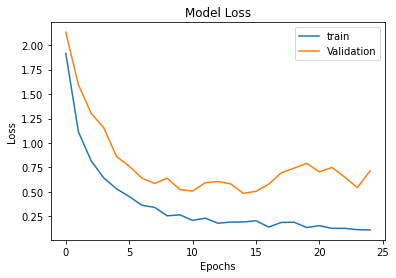

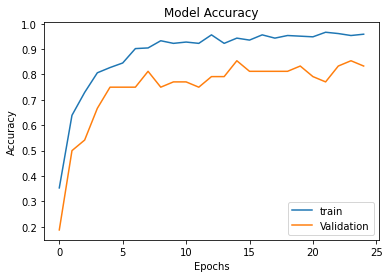

In [12]:
plot_loss(history)
plot_accuracy(history)

In [13]:
from tensorflow.keras.applications.inception_v3 import InceptionV3



def create_model_inception_V3(input_shape=(255, 255, 3), num_classes= 10):
    # Remove fully connected layer at top (include_top=False)
    # Dont load any pre-trained weights (weights=None)
    print(input_shape)
    base_model = InceptionV3(
        include_top=False,
        weights='imagenet',
        input_shape=input_shape,
        )

    # Use keras functional Api to add input and output layers for our task
    input = tf.keras.Input(shape=input_shape)
    base_model = base_model(input)

    # Add our own layers 
    x = layers.GlobalMaxPooling2D()(base_model)
    x = layers.BatchNormalization()(x)
    x = keras.layers.Dense(128, activation="relu")(x)
    x = layers.BatchNormalization()(x)
    x = keras.layers.Dense(64, activation="relu")(x)
    
    output = tf.keras.layers.Dense(num_classes, activation="softmax")(x)

    model = tf.keras.models.Model(input, output)

    return model


In [14]:
model = create_model_inception_V3()

model.summary()

# Freeze base_model
model = lock_base_model_trainable(model, isTrainable=False)

# Now compile model with high learning rate for few epoches
model_2 = compile_model(model, lr=1e-3)


# Train for few epochs
# This will only train the extra layers we added to the top of the model since base_layers weigths are locked
history = model_2.fit(
    train_generator,
    validation_data=validation_generator,
    callbacks=[early_stopping],
    epochs=30
)

(255, 255, 3)
87924736/87910968 [==============================] - 0s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 255, 255, 3)]     0         
                                                                 
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_max_pooling2d_1 (Glo  (None, 2048)             0         
 balMaxPooling2D)                                                
                                                                 
 batch_normalization_96 (Bat  (None, 2048)             8192      
 chNormalization)                                                
                                                                 
 dense_3 (Dense)             (None, 128)               262272    
                                              

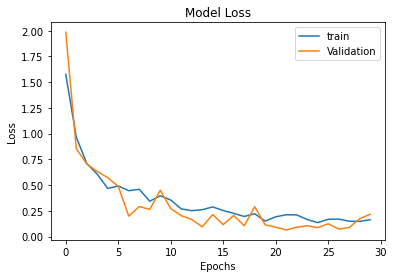

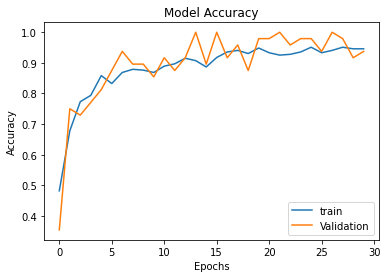

In [15]:
plot_loss(history)
plot_accuracy(history)

### <font color= 'blue'> 6. Fine Tuning 
Fine tuning involved unfreezing the last three layers of the pre-trained models and validating whether better accuracy was recorded. Fine tuning did not show better results for the data set

(255, 255, 3)
9420800/9406464 [==============================] - 0s 0us/step
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 255, 255, 3)]     0         
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 8, 8, 1280)       2257984   
 ional)                                                          
                                                                 
 global_max_pooling2d_2 (Glo  (None, 1280)             0         
 balMaxPooling2D)                                                
                                                                 
 batch_normalization_98 (Bat  (None, 1280)             5120      
 chNormalization)                                                
                                                                 
 dense_6 (Dense)             (None, 128)        

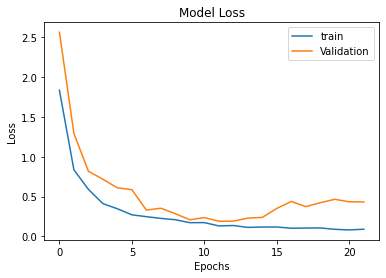

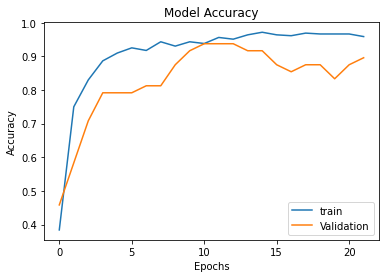

In [16]:

def create_model_MobileNet(input_shape=(255, 255, 3), num_classes= 10):
  
  # Remove fully connected layer at top (include_top=False)
  # Dont load any pre-trained weights (weights=None)
  print(input_shape)
  base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape,
                                              include_top=False,
                                              weights='imagenet')
  # Use keras functional Api to add input and output layers for our task
  input = tf.keras.Input(shape=input_shape)
  base_model = base_model(input)

  # Add our own layers 
  x = layers.GlobalMaxPooling2D()(base_model)
  x = layers.BatchNormalization()(x)
  x = keras.layers.Dense(128, activation="relu")(x)
  x = layers.BatchNormalization()(x)
  x = keras.layers.Dense(64, activation="relu")(x)
  
  output = tf.keras.layers.Dense(num_classes, activation="softmax")(x)

  model = tf.keras.models.Model(input, output)

  return model



model_tuned = create_model_MobileNet()

model_tuned.summary()

# Freeze base_model
model_tuned = lock_base_model_trainable(model_tuned, isTrainable=False)

# Now compile model with high learning rate for few epoches
model_tuned = compile_model(model_tuned, lr=1e-3)


# Train for few epochs
# This will only train the extra layers we added to the top of the model since base_layers weigths are locked
history = model_tuned.fit(
    train_generator,
    validation_data=validation_generator,
    callbacks=[early_stopping],
    epochs=30)

plot_loss(history)
plot_accuracy(history)

### 7. Performance Metrices

In [17]:

# model=model_tuned
# model=model_1
model=model_2
eval_results = model.evaluate(validation_generator, batch_size=20)
#Confusion Matrix and Classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix



print("Accuracy: {:.4f}%".format(eval_results[1] * 100))
dframe_Yval['Pred']= np.argmax(model.predict(validation_generator),axis=1)
dframe_Yval['Recall']=dframe_Yval.apply(lambda x: 1 if x['Category']==x['Pred'] else 0,axis=1)
target_names = ["Class {}".format(i) for i in range(10)]
print('\n---------------------Confusion Matrix--------------------------------\n')
pd.DataFrame(confusion_matrix(dframe_Yval['Category'], dframe_Yval['Pred']),columns=target_names).head(10)





3/3 [==============================] - 1s 207ms/step - loss: 0.2168 - accuracy: 0.9375
Accuracy: 93.7500%

---------------------Confusion Matrix--------------------------------



,Class 0,Class 1,Class 2,Class 3,Class 4,Class 5,Class 6,Class 7,Class 8,Class 9
0,0,0,2,0,1,0,3,1,0,0
1,0,0,0,1,1,0,0,2,0,0
2,2,0,1,0,1,0,0,0,0,0
3,0,0,0,1,1,0,1,0,0,0
4,0,0,0,1,1,0,2,1,1,2
5,0,0,0,0,0,1,0,0,0,1
6,0,2,0,0,0,0,1,0,3,0
7,1,1,1,0,0,0,1,0,0,0
8,1,0,0,0,2,0,0,0,1,1
9,0,1,0,0,1,1,1,0,0,1


In [18]:
print('\n---------------------Classification Report-----------------------\n')

print(classification_report(dframe_Yval['Category'], dframe_Yval['Pred'], target_names=target_names))
list_metrics=list()
for i in range(0,10):
 
  dframe_temp=dframe_Yval[dframe_Yval.Category==i]
  recall=len(dframe_temp[dframe_temp.Recall==1])/len(dframe_temp)
  
  
  list_metrics.append([i,recall*100,len(dframe_Yval[dframe_Yval.Category==i])])

dframe_metrics=pd.DataFrame(list_metrics,columns=['Class','Recall','Occurence'])


dframe_metrics.head(10)


---------------------Classification Report-----------------------

              precision    recall  f1-score   support

     Class 0       0.00      0.00      0.00         7
     Class 1       0.00      0.00      0.00         4
     Class 2       0.25      0.25      0.25         4
     Class 3       0.33      0.33      0.33         3
     Class 4       0.12      0.12      0.12         8
     Class 5       0.50      0.50      0.50         2
     Class 6       0.11      0.17      0.13         6
     Class 7       0.00      0.00      0.00         4
     Class 8       0.20      0.20      0.20         5
     Class 9       0.20      0.20      0.20         5

    accuracy                           0.15        48
   macro avg       0.17      0.18      0.17        48
weighted avg       0.14      0.15      0.14        48



,Class,Recall,Occurence
0,0,0.000000,7
1,1,0.000000,4
2,2,25.000000,4
3,3,33.333333,3
4,4,12.500000,8
5,5,50.000000,2
6,6,16.666667,6
7,7,0.000000,4
8,8,20.000000,5
9,9,20.000000,5


In [19]:
pred = model.predict(test_generator)

df = pd.DataFrame(pred)

df['Category']=np.argmax(pred, axis=1)
df['Prob']=df[df.columns.difference(['Category'])].max(axis=1)
dframe_Ytest['Prediction']=df['Category']
dframe_Ytest['Prob']=df['Prob']
# del(dframe_Ytest['Category'])
dframe_Ytest.head(10)

,index,Category,Prediction,Prob
0,00000.jpg,100,8,0.999789
1,00001.jpg,100,1,0.999541
2,00002.jpg,100,3,0.977507
3,00003.jpg,100,2,0.999997
4,00004.jpg,100,8,0.999977
5,00005.jpg,100,0,0.999244
6,00006.jpg,100,2,0.999876
7,00007.jpg,100,6,0.823726
8,00008.jpg,100,6,0.998840
9,00009.jpg,100,9,0.972752




 --------------Predicted  Category-- 0 ----------------------------------------------




---------Confidence:--->   99.92437362670898
./gdrive/My Drive/cars_dataset/test/00005.jpg
(640, 480)
921600


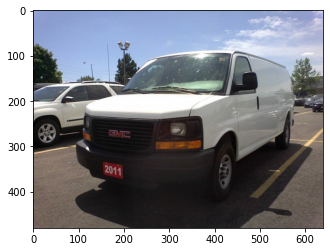


---------Confidence:--->   99.83094930648804
./gdrive/My Drive/cars_dataset/test/00017.jpg
(450, 338)
456300


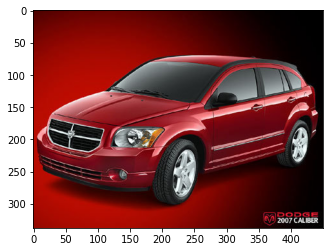


---------Confidence:--->   95.50341367721558
./gdrive/My Drive/cars_dataset/test/00020.jpg
(285, 213)
182115


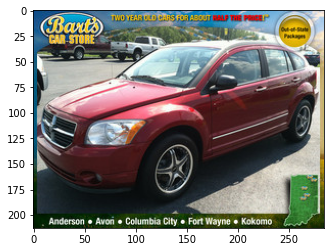


---------Confidence:--->   95.40264010429382
./gdrive/My Drive/cars_dataset/test/00027.jpg
(500, 333)
499500


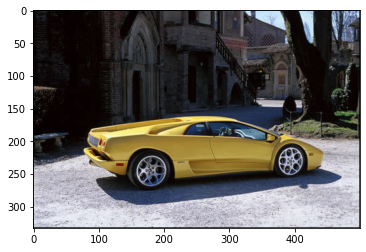



 --------------Predicted  Category-- 1 ----------------------------------------------




---------Confidence:--->   99.95412826538086
./gdrive/My Drive/cars_dataset/test/00001.jpg
(2048, 1536)
9437184


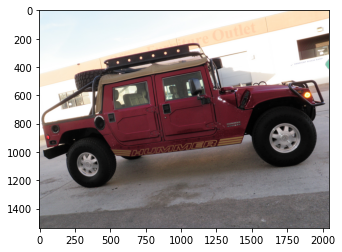


---------Confidence:--->   99.97127652168274
./gdrive/My Drive/cars_dataset/test/00010.jpg
(930, 620)
1729800


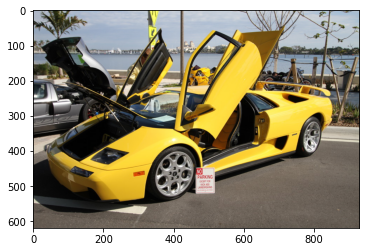


---------Confidence:--->   99.91023540496826
./gdrive/My Drive/cars_dataset/test/00022.jpg
(142, 80)
34080


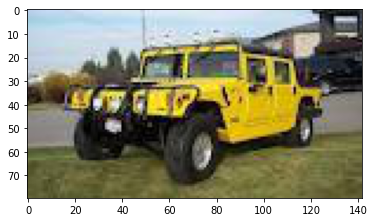


---------Confidence:--->   99.94908571243286
./gdrive/My Drive/cars_dataset/test/00029.jpg
(800, 531)
1274400


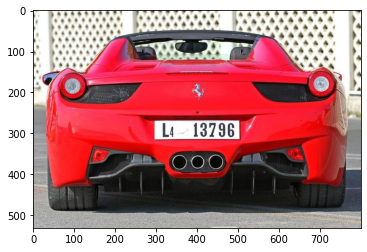



 --------------Predicted  Category-- 2 ----------------------------------------------




---------Confidence:--->   99.99966621398926
./gdrive/My Drive/cars_dataset/test/00003.jpg
(500, 353)
529500


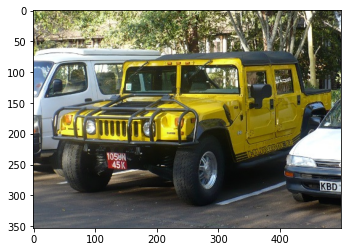


---------Confidence:--->   99.98762607574463
./gdrive/My Drive/cars_dataset/test/00006.jpg
(480, 360)
518400


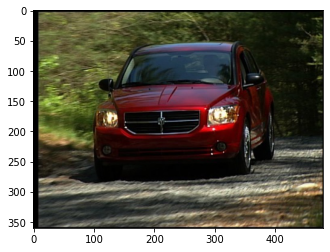


---------Confidence:--->   99.83600974082947
./gdrive/My Drive/cars_dataset/test/00016.jpg
(300, 225)
202500


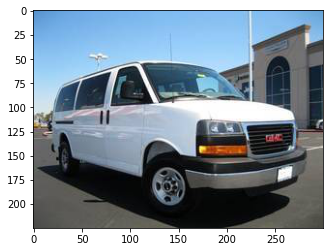


---------Confidence:--->   99.78898167610168
./gdrive/My Drive/cars_dataset/test/00024.jpg
(750, 469)
1055250


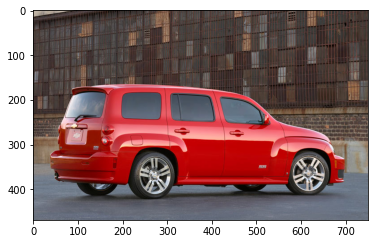



 --------------Predicted  Category-- 3 ----------------------------------------------




---------Confidence:--->   97.75071740150452
./gdrive/My Drive/cars_dataset/test/00002.jpg
(320, 240)
230400


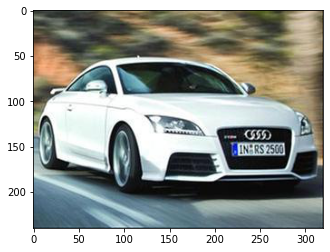


---------Confidence:--->   95.66304087638855
./gdrive/My Drive/cars_dataset/test/00043.jpg
(261, 145)
113535


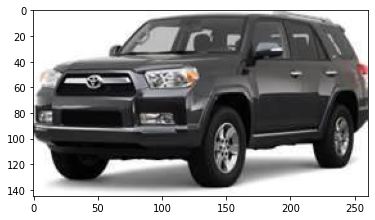


---------Confidence:--->   97.73907661437988
./gdrive/My Drive/cars_dataset/test/00048.jpg
(290, 181)
157470


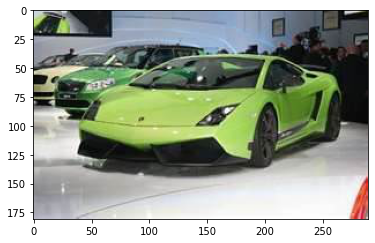


---------Confidence:--->   81.64653778076172
./gdrive/My Drive/cars_dataset/test/00064.jpg
(160, 120)
57600


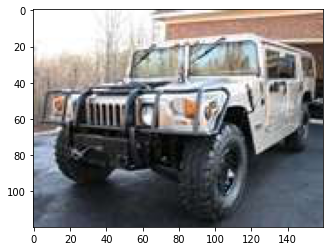



 --------------Predicted  Category-- 4 ----------------------------------------------




---------Confidence:--->   99.970144033432
./gdrive/My Drive/cars_dataset/test/00012.jpg
(300, 156)
140400


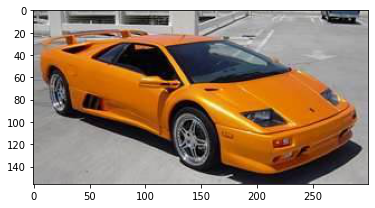


---------Confidence:--->   99.97230172157288
./gdrive/My Drive/cars_dataset/test/00019.jpg
(1024, 768)
2359296


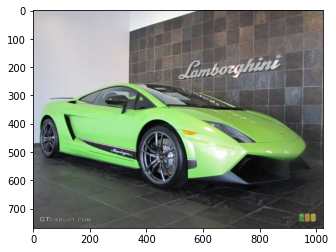


---------Confidence:--->   99.99758005142212
./gdrive/My Drive/cars_dataset/test/00021.jpg
(700, 500)
1050000


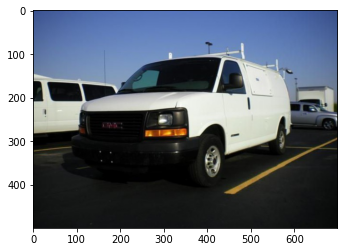


---------Confidence:--->   98.62452745437622
./gdrive/My Drive/cars_dataset/test/00025.jpg
(400, 200)
240000


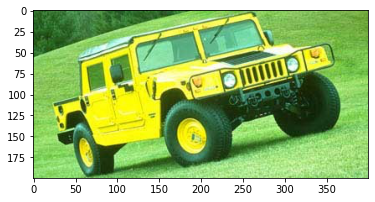



 --------------Predicted  Category-- 5 ----------------------------------------------




---------Confidence:--->   71.56360745429993
./gdrive/My Drive/cars_dataset/test/00015.jpg
(320, 213)
204480


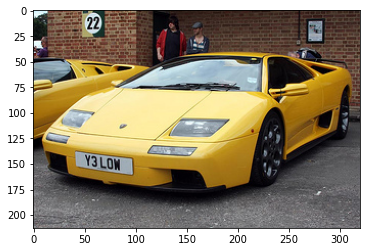


---------Confidence:--->   99.98875856399536
./gdrive/My Drive/cars_dataset/test/00018.jpg
(115, 86)
29670


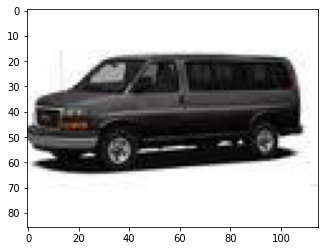


---------Confidence:--->   99.35688972473145
./gdrive/My Drive/cars_dataset/test/00040.jpg
(440, 293)
386760


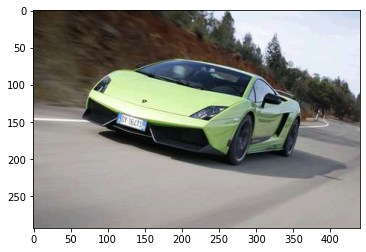


---------Confidence:--->   96.84547781944275
./gdrive/My Drive/cars_dataset/test/00046.jpg
(450, 200)
270000


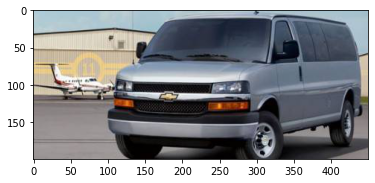



 --------------Predicted  Category-- 6 ----------------------------------------------




---------Confidence:--->   82.37258195877075
./gdrive/My Drive/cars_dataset/test/00007.jpg
(1024, 768)
2359296


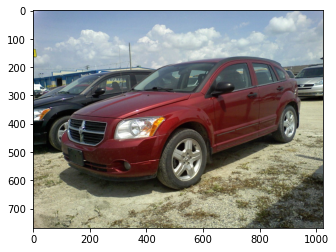


---------Confidence:--->   99.88401532173157
./gdrive/My Drive/cars_dataset/test/00008.jpg
(1920, 1080)
6220800


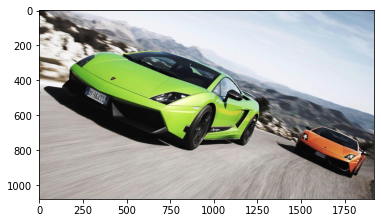


---------Confidence:--->   58.78567099571228
./gdrive/My Drive/cars_dataset/test/00011.jpg
(160, 120)
57600


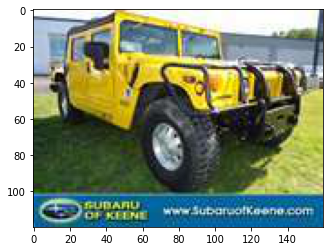


---------Confidence:--->   99.73514080047607
./gdrive/My Drive/cars_dataset/test/00041.jpg
(640, 480)
921600


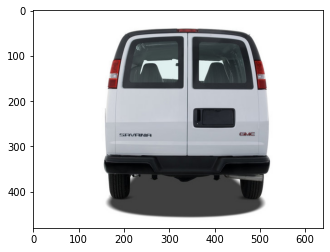



 --------------Predicted  Category-- 7 ----------------------------------------------




---------Confidence:--->   99.15711879730225
./gdrive/My Drive/cars_dataset/test/00033.jpg
(259, 194)
150738


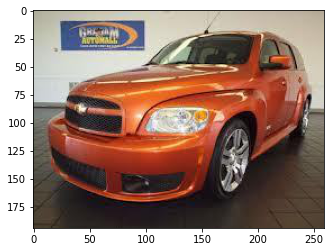


---------Confidence:--->   99.4902491569519
./gdrive/My Drive/cars_dataset/test/00035.jpg
(600, 400)
720000


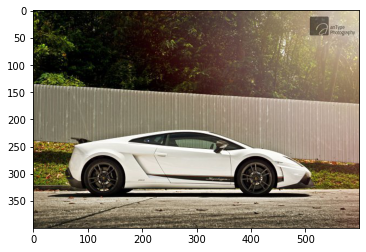


---------Confidence:--->   99.88310933113098
./gdrive/My Drive/cars_dataset/test/00038.jpg
(640, 480)
921600


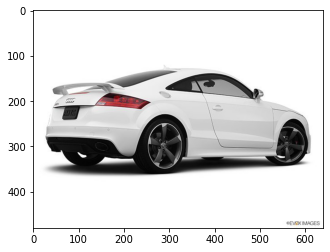


---------Confidence:--->   92.70191192626953
./gdrive/My Drive/cars_dataset/test/00050.jpg
(300, 225)
202500


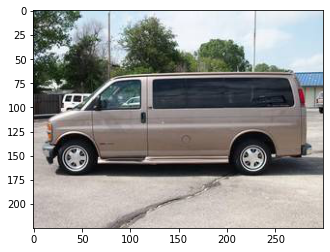



 --------------Predicted  Category-- 8 ----------------------------------------------




---------Confidence:--->   99.97885823249817
./gdrive/My Drive/cars_dataset/test/00000.jpg
(540, 358)
579960


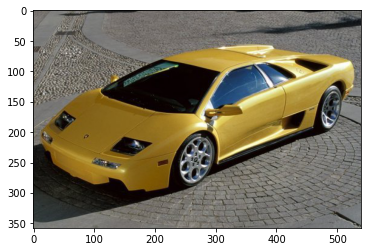


---------Confidence:--->   99.9976634979248
./gdrive/My Drive/cars_dataset/test/00004.jpg
(640, 480)
921600


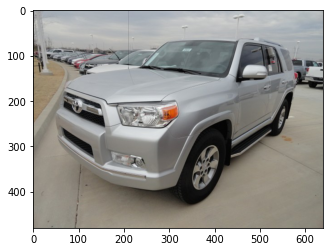


---------Confidence:--->   99.98538494110107
./gdrive/My Drive/cars_dataset/test/00026.jpg
(1920, 1200)
6912000


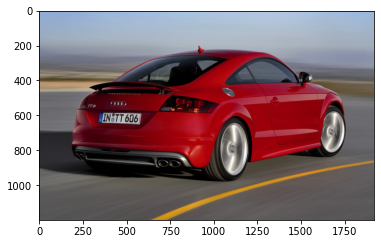


---------Confidence:--->   99.89370703697205
./gdrive/My Drive/cars_dataset/test/00031.jpg
(800, 600)
1440000


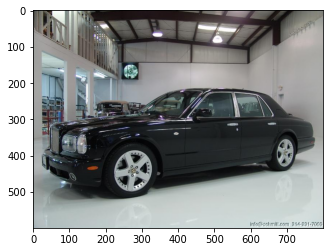



 --------------Predicted  Category-- 9 ----------------------------------------------




---------Confidence:--->   97.27516174316406
./gdrive/My Drive/cars_dataset/test/00009.jpg
(500, 334)
501000


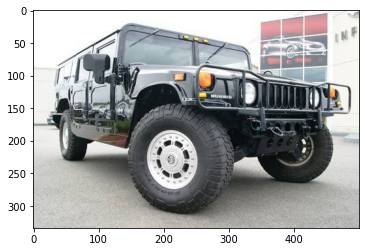


---------Confidence:--->   58.754509687423706
./gdrive/My Drive/cars_dataset/test/00013.jpg
(640, 480)
921600


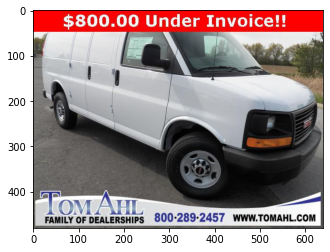


---------Confidence:--->   63.98311257362366
./gdrive/My Drive/cars_dataset/test/00014.jpg
(608, 404)
736896


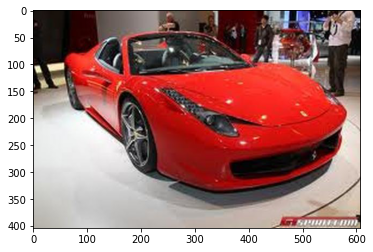


---------Confidence:--->   50.62475800514221
./gdrive/My Drive/cars_dataset/test/00023.jpg
(580, 348)
605520


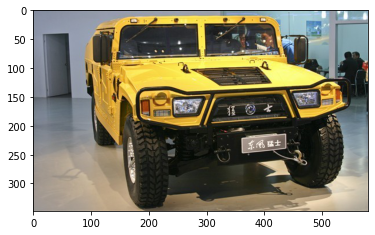

In [20]:
dict_image=dict()
for i in range(0,10):
    dict_image[i]=dframe_Ytest[dframe_Ytest.Prediction==i].head(4)
    


for key,val in dict_image.items():
    print('\n\n --------------Predicted  Category--',str(key),'----------------------------------------------\n')
    print('\n')
    for idx,img in val.iterrows():

      print('\n---------Confidence:--->  ',img["Prob"]*100)
      show_image(os.path.join(path_test,img['index']))



In [21]:
model.save('./gdrive/My Drive/cars_dataset/car_classification_model.h5')
np.save('./gdrive/My Drive/cars_dataset/test_label.npy',df['Category']) 